# VAE Evaluation and Analysis - for final report

**Imports**

In [1]:
# Basic imports
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import math
import corner

from matplotlib import pyplot as plt

from torch.optim import Adam

from torchvision.datasets import MNIST
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from tqdm import tqdm
from torchvision.utils import save_image, make_grid

from astropy.io import fits
from astropy.table import Table

**Model import**

In [2]:
# Hyperparameters
dataset_path = '~/datasets'
cuda = True
DEVICE = torch.device("cuda" if cuda else "cpu")

# Data parameters
input_rows = 10000   # Number of spectra to input, tried 20k before. Try 60k now.
batch_size = 100    # Tested 100
validation_split = .2   # Fraction of dataset to reserve for test
random_seed = 42
np.random.seed(random_seed)
shuffle_toggle = False  # Redundant due to random reduced idx already implemented

# Model Dimensions
x_dim  = 7514
# Originally 400, 200
hidden_dim = 400
latent_dim = 28

# Learning rate
# Default 0.001
lr = 0.001
# Gradient clipping
clipping_value = 1

# VAE Beta
beta = 1
# VAE Separability Loss scaling factor
gamma = 1

# Num epochs
epochs = 2500

In [3]:
"""
    A simple implementation of Gaussian MLP Encoder and Decoder
"""

class Encoder(nn.Module):
  def __init__(self, input_dim, hidden_dim, latent_dim):
    super(Encoder, self).__init__()

    # FC Linear version
    self.FC_input = nn.Linear(input_dim+3, 3757)
    # Try batch normalization
    # nn.BatchNorm1d(hidden_dim)
    self.FC_input2 = nn.Linear(3757, 1878)
    self.FC_input3 = nn.Linear(1878, 939)
    self.FC_input4 = nn.Linear(939, 469)
    self.FC_input5 = nn.Linear(469, 234)
    self.FC_input6 = nn.Linear(234, 117)
    self.FC_input7 = nn.Linear(117, 58)
    # self.FC_input8 = nn.Linear(58, 29)

    # Increase number of layers!!

    # Mean and log variance
    self.FC_mean  = nn.Linear(58, latent_dim)
    self.FC_var   = nn.Linear(58, latent_dim)
    
    self.LeakyReLU = nn.LeakyReLU()
    self.gelu = torch.nn.GELU()
    
    self.training = True
      
  def forward(self, x):
    h_ = self.gelu(self.FC_input(x))
    h_ = self.gelu(self.FC_input2(h_))
    h_ = self.gelu(self.FC_input3(h_))
    h_ = self.gelu(self.FC_input4(h_))
    h_ = self.gelu(self.FC_input5(h_))
    h_ = self.gelu(self.FC_input6(h_))
    h_ = self.gelu(self.FC_input7(h_))
    # h_ = self.LeakyReLU(self.FC_input8(h_))

    mean = self.FC_mean(h_)
    log_var = self.FC_var(h_)                     # encoder produces mean and log of variance 
                                                  #             (i.e., parameters of simple tractable normal distribution "q"

    # Last 3 columns of x should be TEFF, LOGG, FE_H
    passed_parameters = x[:, -3:]
    
    return mean, log_var, passed_parameters

In [4]:
class Decoder(nn.Module):
  def __init__(self, latent_dim, hidden_dim, output_dim):
    super(Decoder, self).__init__()

    # FC Linear version
    # self.FC_hidden = nn.Linear(latent_dim, 29)
    self.FC_hidden2 = nn.Linear(latent_dim+3, 58)
    self.FC_hidden3 = nn.Linear(58, 117)
    self.FC_hidden4 = nn.Linear(117, 234)
    self.FC_hidden5 = nn.Linear(234, 469)
    self.FC_hidden6 = nn.Linear(469, 939)
    self.FC_hidden7 = nn.Linear(939, 1878)
    self.FC_hidden8 = nn.Linear(1878, 3757)
    self.FC_output = nn.Linear(3757, output_dim)
    
    self.LeakyReLU = nn.LeakyReLU()
    self.gelu = torch.nn.GELU()

  def forward(self, x):
    # h = self.LeakyReLU(self.FC_hidden(x))
    h = self.gelu(self.FC_hidden2(x))
    h = self.gelu(self.FC_hidden3(h))
    h = self.gelu(self.FC_hidden4(h))
    h = self.gelu(self.FC_hidden5(h))
    h = self.gelu(self.FC_hidden6(h))
    h = self.gelu(self.FC_hidden7(h))
    h = self.gelu(self.FC_hidden8(h))
  
    # originally torch.sigmoid, but output range incorrect
    # Replace with smooth function - look into this!!
    # Softplus, gelu 

    #activation = torch.nn.Softplus()
    activation = torch.nn.GELU()
    x_hat = activation(self.FC_output(h))
    #x_hat = torch.nn.GELU(self.FC_output(h))
    #print(x_hat)
    return x_hat

In [5]:
class Model(nn.Module):
  def __init__(self, Encoder, Decoder):
    super(Model, self).__init__()
    self.Encoder = Encoder
    self.Decoder = Decoder

  def reparameterization(self, mean, var):
    epsilon = torch.randn_like(var).to(DEVICE)        # sampling epsilon        
    z = mean + var*epsilon                          # reparameterization trick
    return z
  
  # Modified to explicitly pass reduced_parameter_errors
  def forward(self, x, originalIndex, batch_size, reduced_parameter_errors):
    # Generate mean, log var
    mean, log_var, passed_parameters = self.Encoder(x)

    z = self.reparameterization(mean, torch.exp(0.5 * log_var)) # takes exponential function (log var -> var)

    passed_parameters_errors = torch.from_numpy(reduced_parameter_errors[originalIndex : originalIndex + batch_size].astype(np.float32)).to(DEVICE)
    passed_parameters_errors = torch.nn.functional.relu(passed_parameters_errors)
    u = self.reparameterization(passed_parameters, passed_parameters_errors)

    # u = passed_parameters

    # print("Passed parameters raw first row:",passed_parameters[0])
    # print("Passed parameters errors raw first row:",passed_parameters_errors[0])
    # print("u after reparam first row:", u[0])


    z = torch.hstack((z, u))

    x_hat = self.Decoder(z)
    
    # Modified in evaluation file to return latent vector z
    return x_hat, mean, log_var, z

In [6]:
encoder = Encoder(input_dim=x_dim, hidden_dim=hidden_dim, latent_dim=latent_dim)
decoder = Decoder(latent_dim=latent_dim, hidden_dim = hidden_dim, output_dim = x_dim)

model = Model(Encoder=encoder, Decoder=decoder).to(DEVICE)

**Plot Type and Track Select**

In [7]:
plot_type = "logg"
# plot_type = "snr"
# plot_type = "teff"
# plot_type = "logg"
# plot_type = "feh"

track = False   

**Load model**

In [8]:
# model.load_state_dict(torch.load('outputs/3-18-2022-baseline/vae_fullsave_2500_2022-03-21.pt')['state_dict'])
# model.load_state_dict(torch.load('outputs/3-18-2022-kld-boost/vae_best_300_2022-03-21.pt')['state_dict'])
model.load_state_dict(torch.load('outputs/3-18-2022-sep-boost/vae_best_300_2022-03-21.pt'))

# Use this for equal weights:
# model.load_state_dict(torch.load('outputs/3-27-2022-all-boost-2/vae_best_300_2022-03-27.pt')['state_dict'])

# model.load_state_dict(torch.load('outputs/3-29-2022-all-boost-sep-emphasize/vae_best_300_2022-03-29.pt')['state_dict'])
# model.load_state_dict(torch.load('outputs/3-18-2022-kld-only/vae_best_300_2022-03-22.pt')['state_dict'])

<All keys matched successfully>

In [9]:
model.eval()

Model(
  (Encoder): Encoder(
    (FC_input): Linear(in_features=7517, out_features=3757, bias=True)
    (FC_input2): Linear(in_features=3757, out_features=1878, bias=True)
    (FC_input3): Linear(in_features=1878, out_features=939, bias=True)
    (FC_input4): Linear(in_features=939, out_features=469, bias=True)
    (FC_input5): Linear(in_features=469, out_features=234, bias=True)
    (FC_input6): Linear(in_features=234, out_features=117, bias=True)
    (FC_input7): Linear(in_features=117, out_features=58, bias=True)
    (FC_mean): Linear(in_features=58, out_features=28, bias=True)
    (FC_var): Linear(in_features=58, out_features=28, bias=True)
    (LeakyReLU): LeakyReLU(negative_slope=0.01)
    (gelu): GELU()
  )
  (Decoder): Decoder(
    (FC_hidden2): Linear(in_features=31, out_features=58, bias=True)
    (FC_hidden3): Linear(in_features=58, out_features=117, bias=True)
    (FC_hidden4): Linear(in_features=117, out_features=234, bias=True)
    (FC_hidden5): Linear(in_features=234, ou

**Data Load**

In [10]:
print("\n ********************** Opening FITS files from drive **********************")

star_hdus = fits.open('allStar-r12-l33.fits')
astroNN_hdus = fits.open('apogee_astroNN-DR16-v1.fits')
star_spec = fits.open('contspec_dr16_final.fits')

star = star_hdus[1].data
star_astroNN = astroNN_hdus[1].data
star_spectra = star_spec[0].data

star_hdus.close()
astroNN_hdus.close()
star_spec.close()

print("Number of spectra: ", len(star))
print("Data points per spectra: ", len(star_spectra[1]))

# starInfoDebug()


 ********************** Opening FITS files from drive **********************
Number of spectra:  473307
Data points per spectra:  7514


In [11]:
# star_mask = fits.open('contspec_dr16_mask.fits')
# star_err = fits.open('contspec_dr16_err.fits')

# star_mask_data = star_mask[0].data
# star_err_data = star_err[0].data

# star_mask.close()
# star_err.close()

# print("Number of masks: ", len(star_mask_data))
# print("Data points per maskk: ", len(star_mask_data[1]))

# print("Number of errors: ", len(star_err_data))
# print("Data points per error: ", len(star_err_data[1]))

In [12]:
# Further Star Analysis

from astropy.table import Table
dat = Table.read('allStar-r12-l33.fits', format='fits')
names = [name for name in dat.colnames if len(dat[name].shape) <= 1]
df = dat[names].to_pandas()
df.head()

,APSTAR_ID,TARGET_ID,ASPCAP_ID,FILE,APOGEE_ID,TELESCOPE,LOCATION_ID,FIELD,J,J_ERR,...,GAIA_PHOT_G_MEAN_MAG,GAIA_PHOT_BP_MEAN_MAG,GAIA_PHOT_RP_MEAN_MAG,GAIA_RADIAL_VELOCITY,GAIA_RADIAL_VELOCITY_ERROR,GAIA_R_EST,GAIA_R_LO,GAIA_R_HI,TEFF_SPEC,LOGG_SPEC
0,b'apogee.apo1m.s.stars.calibration.VESTA',b'apo1m.1.calibration.VESTA',b'apogee.apo1m.s.r12-l33.calibration.VESTA',b'apStar-r12-VESTA.fits',b'VESTA',b'apo1m',1,b'calibration',-9999.990234,-9999.990234,...,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,5770.700195,4.49400
1,b'apogee.apo25m.s.stars.120+12.2M00000002+7417...,b'apo25m.5046.120+12.2M00000002+7417074',b'apogee.apo25m.s.r12-l33.120+12.2M00000002+74...,b'apStar-r12-2M00000002+7417074.fits',b'2M00000002+7417074',b'apo25m',5046,b'120+12',8.597000,0.039000,...,11.709962,13.291449,10.511990,-51.924661,0.365646,3285.226548,2959.076000,3687.594547,3628.600098,0.88758
2,b'apogee.apo25m.s.stars.060-75.2M00000019-1924...,b'apo25m.5071.060-75.2M00000019-1924498',b'apogee.apo25m.s.r12-l33.060-75.2M00000019-19...,b'apStar-r12-2M00000019-1924498.fits',b'2M00000019-1924498',b'apo25m',5071,b'060-75',11.074000,0.022000,...,12.187422,12.534893,11.669607,17.880444,2.120882,191.348325,156.570781,245.761634,5527.700195,4.23810
3,b'apogee.apo25m.s.stars.116-04.2M00000032+5737...,b'apo25m.4424.116-04.2M00000032+5737103',b'apogee.apo25m.s.r12-l33.116-04.2M00000032+57...,b'apStar-r12-2M00000032+5737103.fits',b'2M00000032+5737103',b'apo25m',4424,b'116-04',10.905000,0.023000,...,12.230203,12.671972,11.631516,-19.196012,1.356420,801.567552,780.757419,823.495963,6449.200195,4.01460
4,b'apogee.apo25m.s.stars.N7789.2M00000032+5737103',b'apo25m.4264.N7789.2M00000032+5737103',b'apogee.apo25m.s.r12-l33.N7789.2M00000032+573...,b'apStar-r12-2M00000032+5737103.fits',b'2M00000032+5737103',b'apo25m',4264,b'N7789',10.905000,0.023000,...,12.230203,12.671972,11.631516,-19.196012,1.356420,801.567552,780.757419,823.495963,6411.600098,3.97610


**Dataset Class**


In [13]:
# https://visualstudiomagazine.com/articles/2020/09/10/pytorch-dataloader.aspx

class spectraDataset(torch.utils.data.Dataset):

  # Num rows = max number of spectra to load
  def __init__(self, src, num_rows=None):
    if num_rows == None:
      spectra = src.astype(np.float32)
    else:
      spectra = src.astype(np.float32)[0:num_rows]

    # y_tmp = np.loadtxt(src_file, max_rows=num_rows,
    #   usecols=7, delimiter="\t", skiprows=0,
    #   dtype=np.long)

    self.x_data = torch.tensor(spectra, dtype=torch.float32).to(DEVICE)

    # self.y_data = T.tensor(y_tmp,
    #   dtype=T.long).to(DEVICE)

  def __len__(self):
    return len(self.x_data)  # required

  def __getitem__(self, idx):
    # if T.is_tensor(idx):
    #   idx = idx.tolist()
    # preds = self.x_data[idx, 0:7]
    # pol = self.y_data[idx]
    # sample = \
    #   { 'predictors' : preds, 'political' : pol }

    sample = self.x_data[idx]
    # Modified March 21 2022 to return batch index
    return sample, idx

**Data Filtering**

In [14]:
# Highly modified fetch data for presentation plots
def fetch_data(df, star_spectra, teff_min, teff_max, logg_min, logg_max, snr_min, snr_max, 
metallicity_min=None, metallicity_max=None):
    # Surpress write on copy warning
    pd.options.mode.chained_assignment = None  # default='warn'

    # # Stays constant throughhout
    # teff_min = 4800
    # teff_max = 4900
    # snr_min = 200
    # snr_max = math.inf

    # Isolate critical columns
    star_df = df[['APSTAR_ID', 'TEFF_SPEC', 'LOGG_SPEC', 'SNR', 'ASPCAPFLAGS', 'STARFLAGS', 'FE_H']]

    if metallicity_min != None:
        #We only include stars with no bad star flags set, SNR > 200, 4000 < teff < 5500, and logg < 3.5.
        star_df_best = star_df.loc[(star_df['TEFF_SPEC'] < teff_max) & (star_df['TEFF_SPEC'] > teff_min) & 
        (star_df['LOGG_SPEC'] < logg_max) & (star_df['LOGG_SPEC'] > logg_min) & 
        (star_df['SNR'] < snr_max) & (star_df['SNR'] > snr_min) &
        (star_df['FE_H'] < metallicity_max) & (star_df['FE_H'] > metallicity_min)]
    else:
        star_df_best = star_df.loc[(star_df['TEFF_SPEC'] < teff_max) & (star_df['TEFF_SPEC'] > teff_min) & 
        (star_df['LOGG_SPEC'] < logg_max) & (star_df['LOGG_SPEC'] > logg_min) & 
        (star_df['SNR'] < snr_max) & (star_df['SNR'] > snr_min)]

    # Decode byte flags into strings
    star_df_best['ASPCAPFLAGS'] = star_df_best['ASPCAPFLAGS'].str.decode("utf-8")

    # Strip out stars with STAR_BAD flag
    star_df_best = star_df_best.loc[~(star_df_best['ASPCAPFLAGS'].str.contains("STAR_BAD"))]

    # Modified to add 3 parameters in 'u'
    # Extract columns with three target parameters
    star_df_best_parameters = star_df_best[["TEFF_SPEC", "LOGG_SPEC", "FE_H"]]
    star_df_best_parameters.reset_index()

    # Make a new array with the associated errors for TEFF, LOGG, FE_H
    # Have to transform 1d numpy array to 2d array for hstack. Transpose to get row -> Column
    parameter_errors = np.hstack((star['teff_err'][None, :].T,star['logg_err'][None, :].T, star['fe_h_err'][None, :].T))
    star_df_best_parameters_np = star_df_best_parameters.to_numpy()

    # print("Parameters before normalization:",star_df_best_parameters_np)
    print("Mean of parameters:",star_df_best_parameters_np.mean(axis=0))

    star_df_best_parameters_np_std_dev = star_df_best_parameters_np.std(axis=0)
    star_df_best_parameters_np_mean = star_df_best_parameters_np.mean(axis=0)
    
    # star_df_best_parameters_np -= star_df_best_parameters_np_mean
    # star_df_best_parameters_np /= star_df_best_parameters_np_std_dev

    # star_df_best_parameters_np[:,0] -= star_df_best_parameters_np[:,0].mean()
    # star_df_best_parameters_np[:,0] /= star_df_best_parameters_np[:,0].std(axis=0)

    # star_df_best_parameters_np[:,1] -= star_df_best_parameters_np[:,1].mean()
    # star_df_best_parameters_np[:,1] /= star_df_best_parameters_np[:,1].std(axis=0)

    # star_df_best_parameters_np[:,2] -= star_df_best_parameters_np[:,2].mean()
    # star_df_best_parameters_np[:,2] /= star_df_best_parameters_np[:,2].std(axis=0)

    # print("Parameters after normalization:",star_df_best_parameters_np)

    #print(star_df_best.head(1))

    # Update the star_spectra dataframe with only 'good' indices
    star_spectra_filtered = star_spectra[star_df_best.index]
    star_spectra_filtered = np.hstack((star_spectra_filtered, star_df_best_parameters_np))

    ### Modified March 21 2022
    #print("Parameter errors before normalization:",parameter_errors)

    parameter_errors = parameter_errors[star_df_best.index]
    # Divide parameter errors by std dev of data
    # parameter_errors /= star_df_best_parameters_np_std_dev

    #print("Parameter errors after normalization:",parameter_errors)


    # Update masks, errors as well
    # star_err_data = star_err_data[star_df_best.index]
    # star_mask_data = star_mask_data[star_df_best.index]

    print("After applying data filters " + str(len(star_spectra_filtered)) + " spectra remaining")
    
    # Bring star_df_best to have same indices as star_spectra_filtered (reset to start from 0)
    star_df_best_reset = star_df_best.reset_index(drop=True)
    #print(star_df_best_reset)
    #print(star_spectra_filtered)

    # # Reduce the dataset down to a manageable size, based on input_rows hyperparameter
    np.random.seed(random_seed)
    random_reduced_idx = list(np.random.choice(len(star_spectra_filtered), input_rows, replace=False))
    
    print("Reduced spectra count to " + str(input_rows))

    # # Grab only spectra with indices randomly selected from above
    #reduced_star_spectra = np.take(star_spectra, random_reduced_idx, 0)

    # Modified to just take first entry
    #reduced_star_spectra = np.array([star_spectra_filtered[0]])
    # Original:
    reduced_star_spectra = np.array([star_spectra_filtered[random_reduced_idx]])

    ### Modified March 21 2022
    reduced_parameter_errors = parameter_errors[random_reduced_idx]

    #print("Reduced spectra:",reduced_star_spectra)

    # For average star calculation
    reduced_star_df_best = star_df_best_reset.iloc[random_reduced_idx]
    #print("Reduced parameters:",reduced_star_df_best)
    # Calculate means of paramaters
    print("Mean TEFF:",reduced_star_df_best["TEFF_SPEC"].mean())
    print("Mean LOGG:",reduced_star_df_best["LOGG_SPEC"].mean())
    print("Mean SNR:",reduced_star_df_best["SNR"].mean())
    print("Mean Fe/H:",reduced_star_df_best["FE_H"].mean())

    # # Normalize - updated to exclude last 3 cols
    # for starRow in reduced_star_spectra:
    #     starRow[0:x_dim] -= starRow[0:x_dim].min()
    #     #print(starRow.max())
    #     if starRow[0:x_dim].max() == 0:
    #         # print("Found zero max")
    #         pass
    #     else:
    #         starRow[0:x_dim] /= starRow[0:x_dim].max()

    #print(pd.DataFrame(reduced_star_spectra))

    return reduced_star_spectra, reduced_parameter_errors

In [15]:
# Quick function to take array and make dataloader
def makeDataloader(reduced_star_spectra):
    # Final normalized, reduced inputs
    train_dataset = spectraDataset(reduced_star_spectra)

    # Creating data indices for training and validation splits:
    dataset_size = len(reduced_star_spectra)
    indices = list(range(dataset_size))
    # split = int(np.floor(validation_split * dataset_size))

    # print("Splitting dataset at", split)

    # If shuffling is enabled, use random seed to shuffle data indices
    if shuffle_toggle:
        np.random.seed(random_seed)
        np.random.shuffle(indices)

    # Generate data loaders
    kwargs = {'num_workers': 0}

    # Try without random sampling (simple split on index)
    # train_loader = DataLoader(train_dataset[split:], batch_size=batch_size, **kwargs)
    test_loader = DataLoader(train_dataset, batch_size = batch_size, **kwargs)

    # print('Batches in train:', len(train_loader))
    print('Batches in test:', len(test_loader))

    return test_loader

**Broad parameter regions**

In [16]:
input_rows = 10000   # Number of spectra to input, tried 20k before. Try 60k now.
batch_size = 100    # Tested 100

In [17]:
#We only include stars with no bad star flags set, SNR > 200, 4000 < teff < 5500, and logg < 3.5.

if plot_type == "snr":
    low_logg_data, low_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 0, logg_max = 3.5, snr_min = 200, snr_max = 300)

    # Modified 03-29-2022 to have full training set
    medium_logg_data, medium_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 0, logg_max = 3.5, snr_min = 300, snr_max = 400)

    high_logg_data, high_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 0, logg_max = 3.5, snr_min = 400, snr_max = math.inf)

if plot_type == "teff":
    low_logg_data, low_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 4400, logg_min = 0, logg_max = 3.5, snr_min = 200, snr_max = math.inf)

    # Modified 03-29-2022 to have full training set
    medium_logg_data, medium_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4400, 
    teff_max = 4800, logg_min = 0, logg_max = 3.5, snr_min = 200, snr_max = math.inf)

    high_logg_data, high_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 5500, logg_min = 0, logg_max = 3.5, snr_min = 200, snr_max = math.inf)

if plot_type == "logg":
    low_logg_data, low_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 0, logg_max = 2, snr_min = 200, snr_max = math.inf)

    # Modified 03-29-2022 to have full training set
    medium_logg_data, medium_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 2, logg_max = 2.8, snr_min = 200, snr_max = math.inf)

    high_logg_data, high_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 2.8, logg_max = 3.5, snr_min = 200, snr_max = math.inf)

if plot_type =="feh":
    # Metallicity
    low_logg_data, low_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 0, logg_max = 3.5, snr_min = 200, snr_max = math.inf, metallicity_min=-0.5, metallicity_max=-0.25)

    # Modified 03-29-2022 to have full training set
    medium_logg_data, medium_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 0, logg_max = 3.5, snr_min = 200, snr_max = math.inf, metallicity_min=-0.25, metallicity_max=0)

    high_logg_data, high_logg_parameter_errors = fetch_data(df = df, star_spectra = star_spectra, teff_min = 4000, 
    teff_max = 5500, logg_min = 0, logg_max = 3.5, snr_min = 200, snr_max = math.inf, metallicity_min=0, metallicity_max=0.25)

Mean of parameters: [ 4.15484912e+03  1.69805193e+00 -1.17843544e+02]
After applying data filters 12948 spectra remaining
Reduced spectra count to 10000
Mean TEFF: 4154.8759765625
Mean LOGG: 1.7013105154037476
Mean SNR: 411.408447265625
Mean Fe/H: -122.44537353515625
Mean of parameters: [ 4.5581494e+03  2.5370915e+00 -1.7448999e+01]
After applying data filters 35926 spectra remaining
Reduced spectra count to 10000
Mean TEFF: 4557.97021484375
Mean LOGG: 2.5377213954925537
Mean SNR: 394.19061279296875
Mean Fe/H: -14.189676284790039
Mean of parameters: [ 4.8096641e+03  3.0446827e+00 -2.9417496e+01]
After applying data filters 24895 spectra remaining
Reduced spectra count to 10000
Mean TEFF: 4808.4150390625
Mean LOGG: 3.043632745742798
Mean SNR: 378.2510681152344
Mean Fe/H: -31.09341812133789


In [18]:
stacked_logg_sample = np.vstack((low_logg_data[0], medium_logg_data[0], high_logg_data[0]))
stacked_logg_sample_error = np.vstack((low_logg_parameter_errors, medium_logg_parameter_errors, high_logg_parameter_errors))

# Normalize additional 3 parameters all together
stacked_logg_sample_std = stacked_logg_sample[:,-3:-1].std(axis=0)
stacked_logg_sample_mean = stacked_logg_sample[:,-3:-1].mean(axis=0)
print(stacked_logg_sample_std)
print(stacked_logg_sample_mean)

stacked_logg_sample[:,-3:-1] -= stacked_logg_sample_mean
stacked_logg_sample[:,-3:-1] /= stacked_logg_sample_std

stacked_logg_sample_error[:,:-1] /= stacked_logg_sample_std
# print(stacked_logg_sample[:,-3:])

# Normalize - updated to exclude last 3 cols
for starRow in stacked_logg_sample:
    starRow[0:x_dim] -= starRow[0:x_dim].min()
    #print(starRow.max())
    if starRow[0:x_dim].max() == 0:
        # print("Found zero max")
        pass
    else:
        starRow[0:x_dim] /= starRow[0:x_dim].max()

# star_df_best_parameters_np -= star_df_best_parameters_np_mean
# star_df_best_parameters_np /= star_df_best_parameters_np_std_dev

logg_sample_1 = stacked_logg_sample[0:10000]
logg_sample_2 = stacked_logg_sample[10000:20000]
logg_sample_3 = stacked_logg_sample[20000:30000]

logg_sample_1_error = stacked_logg_sample_error[0:10000]
logg_sample_2_error = stacked_logg_sample_error[10000:20000]
logg_sample_3_error = stacked_logg_sample_error[20000:30000]

logg_sample_1 = makeDataloader(logg_sample_1)
logg_sample_2 = makeDataloader(logg_sample_2)
logg_sample_3 = makeDataloader(logg_sample_3)

[319.89893      0.60006964]
[4.507082e+03 2.427560e+00]
Batches in test: 100
Batches in test: 100
Batches in test: 100


**Latent Space Plotting**

In [19]:
# Feed model helper function
def feed_model(data_loader, parameter_errors):
  latent_vector_array = []

  with torch.no_grad():
    for batch_idx, (x, _) in enumerate(tqdm(data_loader)):
      x = x.view(batch_size, x_dim+3)
      x = x.to(DEVICE)

      #print("Looking at original batch index:", batch_idx)
      x_hat, mean, log_var, z = model(x, batch_idx, batch_size, parameter_errors)

      # Each batch has 100 latent vecs of size 28
      for batchItem in z:
        # Add to overall latent vector array
        latent_vector_array += [batchItem.cpu().detach().numpy()]

  return latent_vector_array

**Feed Model with Filtered Data**

In [20]:
high_logg_array = feed_model(logg_sample_3, logg_sample_3_error)
medium_logg_array = feed_model(logg_sample_2, logg_sample_2_error)
low_logg_array = feed_model(logg_sample_1, logg_sample_1_error)

100%|██████████| 100/100 [00:00<00:00, 128.09it/s]


**Corner Plot Without Tracks**

Text(0.5, 1.0, 'Logg Latent Space Comparison')

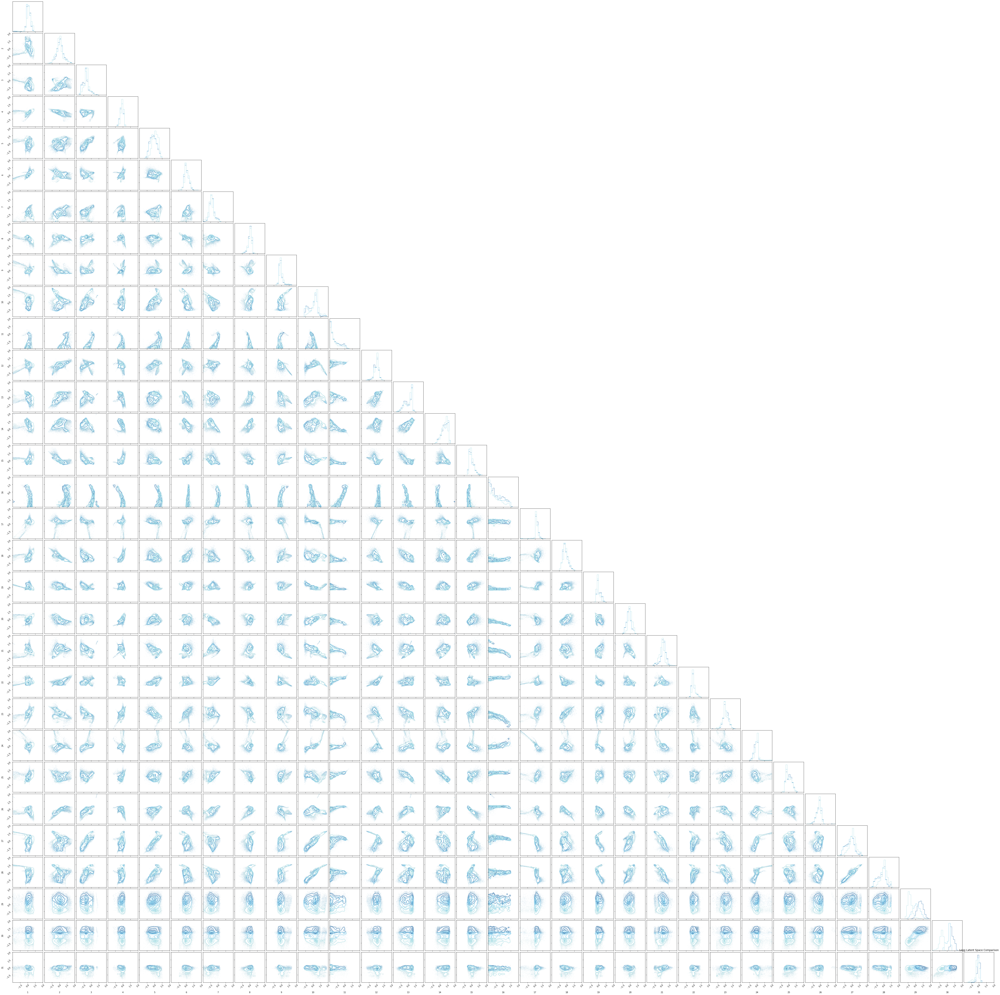

In [21]:
figure_logg = corner.corner(np.array(high_logg_array), color="steelblue", labels=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31], range=[(-3,3)]*31)
corner.corner(np.array(medium_logg_array), color="skyblue", fig=figure_logg, range=[(-3,3)]*31)
corner.corner(np.array(low_logg_array), color="powderblue", fig=figure_logg, range=[(-3,3)]*31)
plt.title("Logg Latent Space Comparison")
# plt.show()

*Sample testing stars with similar parameters - vary just one parameter up/down e.g. logg or teff
Plot in latent space and try and generate tracks, see if any trends*

**Track Visualization**

In [22]:
batch_size = 50
input_rows = 50

In [23]:
# Highly modified fetch data single for presentation plots
def fetch_data_single_fixed(df, star_spectra, teff_min, teff_max, logg_min, logg_max, snr_min, snr_max,
metallicity_min=None, metallicity_max=None):
    # Surpress write on copy warning
    pd.options.mode.chained_assignment = None  # default='warn'

    # # Stays constant throughhout
    # teff_min = 4800
    # teff_max = 4900
    # snr_min = 200
    # snr_max = math.inf

    # Isolate critical columns
    star_df = df[['APSTAR_ID', 'TEFF_SPEC', 'LOGG_SPEC', 'SNR', 'ASPCAPFLAGS', 'STARFLAGS', 'FE_H']]

    if metallicity_min != None:
        #We only include stars with no bad star flags set, SNR > 200, 4000 < teff < 5500, and logg < 3.5.
        star_df_best = star_df.loc[(star_df['TEFF_SPEC'] < teff_max) & (star_df['TEFF_SPEC'] > teff_min) & 
        (star_df['LOGG_SPEC'] < logg_max) & (star_df['LOGG_SPEC'] > logg_min) & 
        (star_df['SNR'] < snr_max) & (star_df['SNR'] > snr_min) &
        (star_df['FE_H'] < metallicity_max) & (star_df['FE_H'] > metallicity_min)]
    else:
        star_df_best = star_df.loc[(star_df['TEFF_SPEC'] < teff_max) & (star_df['TEFF_SPEC'] > teff_min) & 
        (star_df['LOGG_SPEC'] < logg_max) & (star_df['LOGG_SPEC'] > logg_min) & 
        (star_df['SNR'] < snr_max) & (star_df['SNR'] > snr_min)]

    # Decode byte flags into strings
    star_df_best['ASPCAPFLAGS'] = star_df_best['ASPCAPFLAGS'].str.decode("utf-8")

    # Strip out stars with STAR_BAD flag
    star_df_best = star_df_best.loc[~(star_df_best['ASPCAPFLAGS'].str.contains("STAR_BAD"))]

    # Modified to add 3 parameters in 'u'
    # Extract columns with three target parameters
    star_df_best_parameters = star_df_best[["TEFF_SPEC", "LOGG_SPEC", "FE_H"]]
    star_df_best_parameters.reset_index()

    # Make a new array with the associated errors for TEFF, LOGG, FE_H
    # Have to transform 1d numpy array to 2d array for hstack. Transpose to get row -> Column
    parameter_errors = np.hstack((star['teff_err'][None, :].T,star['logg_err'][None, :].T, star['fe_h_err'][None, :].T))
    star_df_best_parameters_np = star_df_best_parameters.to_numpy()

    # print("Parameters before normalization:",star_df_best_parameters_np)
    print("Mean of parameters:",star_df_best_parameters_np.mean(axis=0))

    star_df_best_parameters_np_std_dev = star_df_best_parameters_np.std(axis=0)
    star_df_best_parameters_np_mean = star_df_best_parameters_np.mean(axis=0)
    
    # star_df_best_parameters_np -= star_df_best_parameters_np_mean
    # star_df_best_parameters_np /= star_df_best_parameters_np_std_dev

    # star_df_best_parameters_np[:,0] -= star_df_best_parameters_np[:,0].mean()
    # star_df_best_parameters_np[:,0] /= star_df_best_parameters_np[:,0].std(axis=0)

    # star_df_best_parameters_np[:,1] -= star_df_best_parameters_np[:,1].mean()
    # star_df_best_parameters_np[:,1] /= star_df_best_parameters_np[:,1].std(axis=0)

    # star_df_best_parameters_np[:,2] -= star_df_best_parameters_np[:,2].mean()
    # star_df_best_parameters_np[:,2] /= star_df_best_parameters_np[:,2].std(axis=0)

    # print("Parameters after normalization:",star_df_best_parameters_np)

    #print(star_df_best.head(1))

    # Update the star_spectra dataframe with only 'good' indices
    star_spectra_filtered = star_spectra[star_df_best.index]
    star_spectra_filtered = np.hstack((star_spectra_filtered, star_df_best_parameters_np))

    ### Modified March 21 2022
    #print("Parameter errors before normalization:",parameter_errors)

    parameter_errors = parameter_errors[star_df_best.index]
    # Divide parameter errors by std dev of data
    # parameter_errors /= star_df_best_parameters_np_std_dev

    #print("Parameter errors after normalization:",parameter_errors)


    # Update masks, errors as well
    # star_err_data = star_err_data[star_df_best.index]
    # star_mask_data = star_mask_data[star_df_best.index]

    print("After applying data filters " + str(len(star_spectra_filtered)) + " spectra remaining")
    
    # Bring star_df_best to have same indices as star_spectra_filtered (reset to start from 0)
    star_df_best_reset = star_df_best.reset_index(drop=True)
    #print(star_df_best_reset)
    #print(star_spectra_filtered)

    # # Reduce the dataset down to a manageable size, based on input_rows hyperparameter
    np.random.seed(random_seed)
    random_reduced_idx = list(np.random.choice(len(star_spectra_filtered), input_rows, replace=False))
    
    print("Reduced spectra count to " + str(input_rows))

    # # Grab only spectra with indices randomly selected from above
    #reduced_star_spectra = np.take(star_spectra, random_reduced_idx, 0)

    # Modified to just take first entry
    #reduced_star_spectra = np.array([star_spectra_filtered[0]])
    # Original:
    reduced_star_spectra = np.array([star_spectra_filtered[random_reduced_idx]])

    ### Modified March 21 2022
    reduced_parameter_errors = parameter_errors[random_reduced_idx]

    #print("Reduced spectra:",reduced_star_spectra)

    # For average star calculation
    reduced_star_df_best = star_df_best_reset.iloc[random_reduced_idx]
    #print("Reduced parameters:",reduced_star_df_best)
    # Calculate means of paramaters
    print("Mean TEFF:",reduced_star_df_best["TEFF_SPEC"].mean())
    print("Mean LOGG:",reduced_star_df_best["LOGG_SPEC"].mean())
    print("Mean SNR:",reduced_star_df_best["SNR"].mean())
    print("Mean Fe/H:",reduced_star_df_best["FE_H"].mean())

    # # Normalize - updated to exclude last 3 cols
    # for starRow in reduced_star_spectra:
    #     starRow[0:x_dim] -= starRow[0:x_dim].min()
    #     #print(starRow.max())
    #     if starRow[0:x_dim].max() == 0:
    #         # print("Found zero max")
    #         pass
    #     else:
    #         starRow[0:x_dim] /= starRow[0:x_dim].max()

    #print(pd.DataFrame(reduced_star_spectra))

    return reduced_star_spectra, reduced_parameter_errors

**Fixed Track Point Generation**

In [24]:
# Was accidentally renormalizing with each subsample. This corrects it.

if plot_type == "snr":
    logg_sample_1_raw, logg_sample_1_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3, logg_max = 3.1, snr_min = 200, snr_max = 250)

    logg_sample_2_raw, logg_sample_2_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3, logg_max = 3.1, snr_min = 250, snr_max = 300)

    logg_sample_3_raw, logg_sample_3_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3, logg_max = 3.1, snr_min = 300, snr_max = 350)

    logg_sample_4_raw, logg_sample_4_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3, logg_max = 3.1, snr_min = 350, snr_max = 400)

    logg_sample_5_raw, logg_sample_5_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3, logg_max = 3.1, snr_min = 400, snr_max = math.inf)

if plot_type == "teff":
    logg_sample_1_raw, logg_sample_1_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4100, 
    teff_max = 4200, logg_min = 2, logg_max = 2.2, snr_min = 200, snr_max = math.inf)

    logg_sample_2_raw, logg_sample_2_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4200, 
    teff_max = 4300, logg_min = 2, logg_max = 2.2, snr_min = 200, snr_max = math.inf)

    logg_sample_3_raw, logg_sample_3_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4300, 
    teff_max = 4350, logg_min = 2, logg_max = 2.2, snr_min = 200, snr_max = math.inf)

    logg_sample_4_raw, logg_sample_4_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4350, 
    teff_max = 4400, logg_min = 2, logg_max = 2.2, snr_min = 200, snr_max = math.inf)

    logg_sample_5_raw, logg_sample_5_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4400, 
    teff_max = 4500, logg_min = 2, logg_max = 2.2, snr_min = 200, snr_max = math.inf)

if plot_type == "logg":
    logg_sample_1_raw, logg_sample_1_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 2.5, logg_max = 2.6, snr_min = 200, snr_max = math.inf)

    logg_sample_2_raw, logg_sample_2_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 2.6, logg_max = 2.8, snr_min = 200, snr_max = math.inf)

    logg_sample_3_raw, logg_sample_3_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 2.8, logg_max = 3.0, snr_min = 200, snr_max = math.inf)

    logg_sample_4_raw, logg_sample_4_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3.0, logg_max = 3.4, snr_min = 200, snr_max = math.inf)

    logg_sample_5_raw, logg_sample_5_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3.4, logg_max = 3.5, snr_min = 200, snr_max = math.inf)

if plot_type == "feh":
    logg_sample_1_raw, logg_sample_1_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3.2, logg_max = 3.3, snr_min = 200, snr_max = math.inf, metallicity_min = -0.5, metallicity_max = -0.3)

    logg_sample_2_raw, logg_sample_2_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3.2, logg_max = 3.3, snr_min = 200, snr_max = math.inf, metallicity_min = -0.3, metallicity_max = -0.2)

    logg_sample_3_raw, logg_sample_3_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3.2, logg_max = 3.3, snr_min = 200, snr_max = math.inf, metallicity_min = -0.2, metallicity_max = -0.1)

    logg_sample_4_raw, logg_sample_4_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3.2, logg_max = 3.3, snr_min = 200, snr_max = math.inf, metallicity_min = -0.1, metallicity_max = 0.1)

    logg_sample_5_raw, logg_sample_5_error_raw = fetch_data_single_fixed(df = df, star_spectra = star_spectra, teff_min = 4800, 
    teff_max = 4900, logg_min = 3.2, logg_max = 3.3, snr_min = 200, snr_max = math.inf, metallicity_min = 0.1, metallicity_max = 0.5)

Mean of parameters: [ 4.8524175e+03  2.5584843e+00 -6.2627989e-01]
After applying data filters 76 spectra remaining
Reduced spectra count to 50
Mean TEFF: 4853.35986328125
Mean LOGG: 2.5527162551879883
Mean SNR: 306.1838684082031
Mean Fe/H: -0.6267534494400024
Mean of parameters: [ 4.8472075e+03  2.7383132e+00 -3.5669601e-01]
After applying data filters 2698 spectra remaining
Reduced spectra count to 50
Mean TEFF: 4852.16796875
Mean LOGG: 2.7514560222625732
Mean SNR: 387.7123107910156
Mean Fe/H: -0.3358057737350464
Mean of parameters: [ 4.8483569e+03  2.8788333e+00 -1.7213888e-01]
After applying data filters 2888 spectra remaining
Reduced spectra count to 50
Mean TEFF: 4845.8154296875
Mean LOGG: 2.8588640689849854
Mean SNR: 376.186767578125
Mean Fe/H: -0.16404381394386292
Mean of parameters: [ 4.8505640e+03  3.1876776e+00 -1.3502706e+01]
After applying data filters 2244 spectra remaining
Reduced spectra count to 50
Mean TEFF: 4852.83154296875
Mean LOGG: 3.190932035446167
Mean SNR: 395.

In [25]:
stacked_logg_sample = np.vstack((logg_sample_1_raw[0], logg_sample_2_raw[0], logg_sample_3_raw[0], logg_sample_4_raw[0], logg_sample_5_raw[0]))

stacked_logg_sample_error = np.vstack((logg_sample_1_error_raw, logg_sample_2_error_raw, logg_sample_3_error_raw, logg_sample_4_error_raw, logg_sample_5_error_raw))

# Normalize additional 3 parameters all together
stacked_logg_sample_std = stacked_logg_sample[:,-3:-1].std(axis=0)
stacked_logg_sample_mean = stacked_logg_sample[:,-3:-1].mean(axis=0)
print(stacked_logg_sample_std)
print(stacked_logg_sample_mean)

stacked_logg_sample[:,-3:-1] -= stacked_logg_sample_mean
stacked_logg_sample[:,-3:-1] /= stacked_logg_sample_std

stacked_logg_sample_error[:,:-1] /= stacked_logg_sample_std

# Normalize - updated to exclude last 3 cols
for starRow in stacked_logg_sample:
    starRow[0:x_dim] -= starRow[0:x_dim].min()
    #print(starRow.max())
    if starRow[0:x_dim].max() == 0:
        # print("Found zero max")
        pass
    else:
        starRow[0:x_dim] /= starRow[0:x_dim].max()

# star_df_best_parameters_np -= star_df_best_parameters_np_mean
# star_df_best_parameters_np /= star_df_best_parameters_np_std_dev

logg_sample_1 = stacked_logg_sample[0:50]
logg_sample_2 = stacked_logg_sample[50:100]
logg_sample_3 = stacked_logg_sample[100:150]
logg_sample_4 = stacked_logg_sample[150:200]
logg_sample_5 = stacked_logg_sample[200:250]

logg_sample_1_error = stacked_logg_sample_error[0:50]
logg_sample_2_error = stacked_logg_sample_error[50:100]
logg_sample_3_error = stacked_logg_sample_error[100:150]
logg_sample_4_error = stacked_logg_sample_error[150:200]
logg_sample_5_error = stacked_logg_sample_error[200:250]

logg_sample_1 = makeDataloader(logg_sample_1)
logg_sample_2 = makeDataloader(logg_sample_2)
logg_sample_3 = makeDataloader(logg_sample_3)
logg_sample_4 = makeDataloader(logg_sample_4)
logg_sample_5 = makeDataloader(logg_sample_5)

[28.602327    0.32723585]
[4.8515996e+03 2.9611428e+00]
Batches in test: 1
Batches in test: 1
Batches in test: 1
Batches in test: 1
Batches in test: 1


**Extract SNR/Teff/LogG Track Samples**

In [26]:
# logg_sample_1, logg_sample_1_error = fetch_data_single(df = df, star_spectra = star_spectra, teff_min = 4800, 
# teff_max = 4900, logg_min = 1, logg_max = 2.5, snr_min = 200, snr_max = math.inf)

# logg_sample_2, logg_sample_2_error = fetch_data_single(df = df, star_spectra = star_spectra, teff_min = 4800, 
# teff_max = 4900, logg_min = 2.5, logg_max = 2.6, snr_min = 200, snr_max = math.inf)

# logg_sample_3, logg_sample_3_error = fetch_data_single(df = df, star_spectra = star_spectra, teff_min = 4800, 
# teff_max = 4900, logg_min = 2.6, logg_max = 2.8, snr_min = 200, snr_max = math.inf)

# logg_sample_4, logg_sample_4_error = fetch_data_single(df = df, star_spectra = star_spectra, teff_min = 4800, 
# teff_max = 4900, logg_min = 2.8, logg_max = 3.4, snr_min = 200, snr_max = math.inf)

# logg_sample_5, logg_sample_5_error = fetch_data_single(df = df, star_spectra = star_spectra, teff_min = 4800, 
# teff_max = 4900, logg_min = 3.4, logg_max = 3.5, snr_min = 200, snr_max = math.inf)

In [27]:
# Feed model helper function
def feed_model_single(data_loader, parameter_errors):
  latent_vector_array = []

  with torch.no_grad():
    for batch_idx, (x, _) in enumerate(tqdm(data_loader)):
      #print(x)
      x = x.view(batch_size, x_dim+3)
      x = x.to(DEVICE)    
      x_hat, mean, log_var, z = model(x, batch_idx, batch_size, parameter_errors)

      # Debug latent space print
      #print(z)

      # Test print first row of z
      print(z[0])

      latent_vector_array += [z.cpu().detach().numpy()]

  return latent_vector_array

In [28]:
logg_sample_1_array = feed_model_single(logg_sample_1, logg_sample_1_error)
logg_sample_2_array = feed_model_single(logg_sample_2, logg_sample_2_error)
logg_sample_3_array = feed_model_single(logg_sample_3, logg_sample_3_error)
logg_sample_4_array = feed_model_single(logg_sample_4, logg_sample_4_error)
logg_sample_5_array = feed_model_single(logg_sample_5, logg_sample_5_error)

  0%|          | 0/1 [00:00<?, ?it/s]

tensor([-0.1965,  0.0720, -1.7075, -0.4931, -1.1186, -0.0482, -0.9438,  0.0555,
        -0.2217, -1.3532, -3.6014, -0.4883, -0.5745,  0.8526,  0.1762, -6.1431,
         0.5851, -0.4135,  0.5974, -0.9471,  0.9385, -0.2739,  0.3577, -0.6304,
         0.2933, -0.4207, -1.8004, -1.8821,  2.2874, -1.2073, -0.1658],
       device='cuda:0')

  0%|          | 0/1 [00:00<?, ?it/s]


tensor([ 0.3760, -1.3759, -2.0635, -0.0272, -0.8559,  0.6794, -1.0835, -0.4909,
        -0.0231, -1.6837, -4.5992, -1.1196, -1.6887, -0.0160,  1.2062, -5.9880,
         0.3398,  0.7869,  0.9004, -0.1739,  0.6074,  0.3215,  0.7342, -1.0243,
         0.9628, -1.4200, -1.1662, -2.0835,  0.5115, -0.6576, -0.3344],
       device='cuda:0')
tensor([-0.0210, -0.2254, -1.9287, -0.3162, -1.1127,  0.2862, -0.9637,  0.2532,
        -0.4168, -1.5095, -3.9720, -0.4499, -0.7608,  0.8329,  0.0796, -6.4830,
         0.8608, -0.2544,  0.6745, -0.7868,  0.8796, -0.0958,  0.4785, -0.9654,
         0.3553, -0.6836, -1.8740, -1.8125, -3.2428, -0.7358, -0.1466],
       device='cuda:0')
tensor([ 0.0396,  0.8762, -0.5520, -0.3589, -0.1959, -0.0819, -0.6300,  0.2710,
        -0.4344, -0.0892, -2.2857,  0.0442,  0.2815,  0.8977, -0.5922, -4.7379,
         0.2713, -0.7841, -0.0376, -0.5516,  0.5296, -0.0077, -0.0360, -0.1641,
         0.1421,  0.2718, -0.3970, -0.6148, -3.2603,  1.5738, -0.0097],
       device='

100%|██████████| 1/1 [00:00<00:00, 25.62it/s]

**Average latent space values**

In [29]:
# Averaging helper function
def latentValAverager(input):
    # multiple_lists = [[2,5,1,9], [4,9,5,10]]
    arrays = [np.array(x) for x in input]
    return [np.mean(k) for k in zip(*arrays)]

In [30]:
# Latent space values averaged across 10 samples from each class - raw list of 28 outputs
logg_sample_1_array_mean = latentValAverager(logg_sample_1_array[0]) 
logg_sample_2_array_mean = latentValAverager(logg_sample_2_array[0]) 
logg_sample_3_array_mean = latentValAverager(logg_sample_3_array[0]) 
logg_sample_4_array_mean = latentValAverager(logg_sample_4_array[0]) 
logg_sample_5_array_mean = latentValAverager(logg_sample_5_array[0]) 

**Make large tracking plot (all dims)**

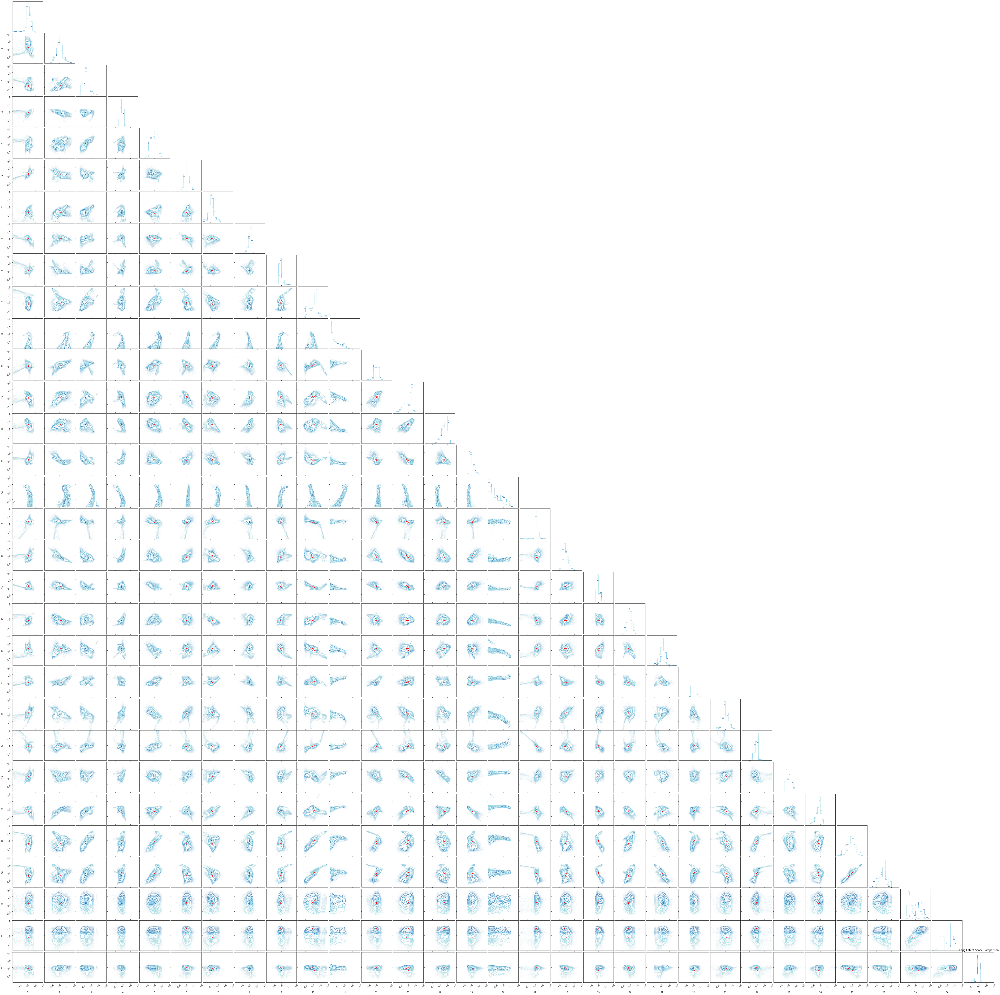

In [31]:
ndim = 31

# ndim, nsamples = ndim, 50
# np.random.seed(42)
# samples = np.random.randn(ndim * nsamples).reshape([nsamples, ndim])
# figure = corner.corner(samples)

# Extract the axes
axes = np.array(figure_logg.axes).reshape((ndim, ndim))

# Loop over the diagonal - histograms
# for i in range(ndim):

#     ax = axes[i, i]
#     ax.axvline(1, color="g")
#     ax.axvline(1, color="r")

# Loop over scatter plots
for yi in range(ndim):
    for xi in range(yi):
        ax = axes[yi, xi]
        # ax.annotate(str(yi)+","+str(xi), (logg_sample_1_array[0][0][xi], logg_sample_1_array[0][0][yi]))

        ax.plot(logg_sample_1_array_mean[xi], logg_sample_1_array_mean[yi], marker="o", markersize=2, color="red")
        ax.plot(logg_sample_2_array_mean[xi], logg_sample_2_array_mean[yi], marker="o", markersize=2, color="red")
        ax.plot(logg_sample_3_array_mean[xi], logg_sample_3_array_mean[yi], marker="o", markersize=2, color="red")
        ax.plot(logg_sample_4_array_mean[xi], logg_sample_4_array_mean[yi], marker="o", markersize=2, color="red")
        ax.plot(logg_sample_5_array_mean[xi], logg_sample_5_array_mean[yi], marker="o", markersize=2, color="red")

        # # Add text label
        # ax.annotate("1",xy=(logg_sample_1_array_mean[xi], logg_sample_1_array_mean[yi]), fontsize=8)
        # ax.annotate("2",xy=(logg_sample_2_array_mean[xi], logg_sample_2_array_mean[yi]), fontsize=8)
        # ax.annotate("3",xy=(logg_sample_3_array_mean[xi], logg_sample_3_array_mean[yi]), fontsize=8)
        # ax.annotate("4",xy=(logg_sample_4_array_mean[xi], logg_sample_4_array_mean[yi]), fontsize=8)
        # ax.annotate("5",xy=(logg_sample_5_array_mean[xi], logg_sample_5_array_mean[yi]), fontsize=8)

        # Old plotting code for single sample
        # ax.plot(logg_sample_6_array[0][0][xi], logg_sample_6_array[0][0][yi], marker=".", markersize=10, color="lavender")

        # ax.plot(1, 1, "sg")
        # ax.plot(2, 2, "sr")

figure_logg
    

**Make cropped tracking plot (focused)**

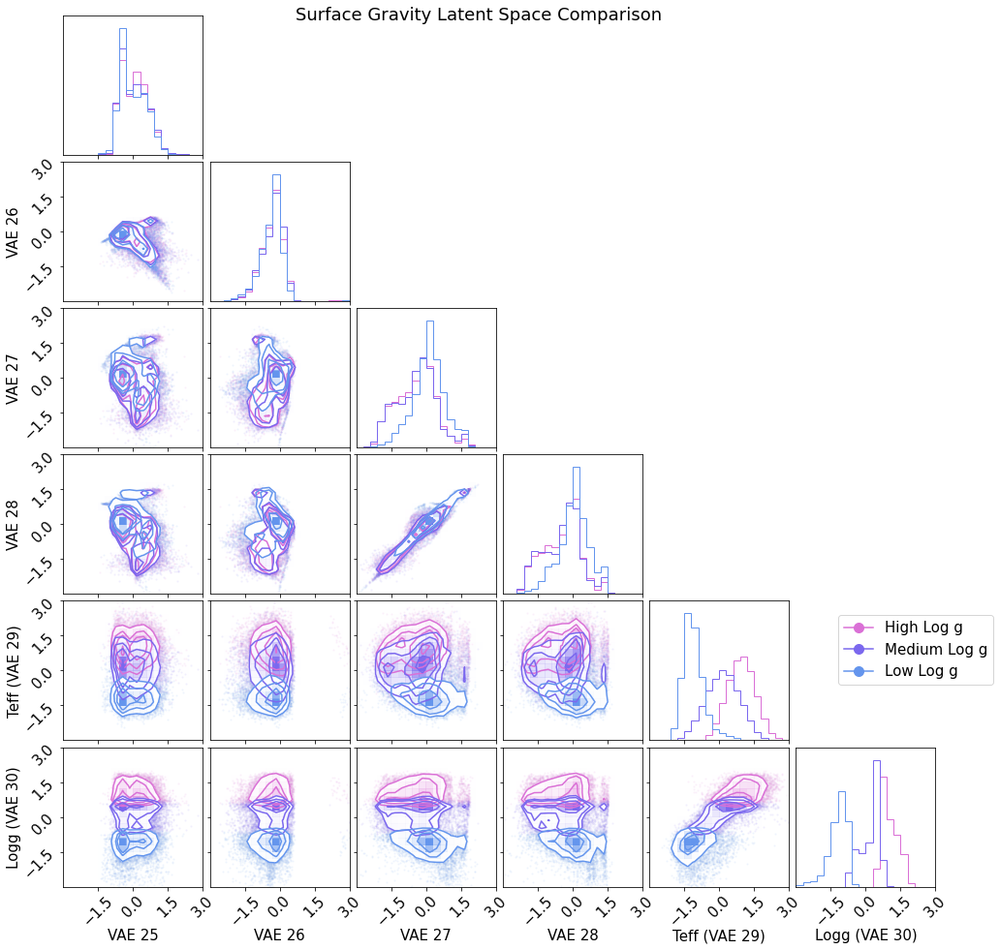

In [32]:
# Test Plot for Selecting categories
from matplotlib.lines import Line2D

plt.rcParams.update({'font.size': 15})


highLabel = ""
medLabel = ""
lowLabel = ""

offset = 0

if plot_type == "snr":
    figure_logg_crop = corner.corner(np.array(high_logg_array)[:, [16,17,18,19,20,21]], color="orchid", labels=['VAE 17','VAE 18','VAE 19','VAE 20','VAE 21','VAE 22'], range=[(-2, 2)]*6)
    corner.corner(np.array(medium_logg_array)[:, [16,17,18,19,20,21]], color="mediumslateblue", fig=figure_logg_crop, range=[(-2,2)]*6)
    corner.corner(np.array(low_logg_array)[:, [16,17,18,19,20,21]], color="cornflowerblue", fig=figure_logg_crop, range=[(-2,2)]*6)
    # Offset = first index in crop
    offset = 16

    figure_logg_crop.suptitle("Signal-to-Noise Ratio Latent Space Comparison")
    highLabel = "High SNR"
    medLabel = "Medium SNR"
    lowLabel = "Low SNR"
    
    legend_elements = [Line2D([0], [0], marker='o', color='purple', label='Track (specific stars)', markerfacecolor='red', markersize=10),
                   Line2D([0], [0], marker='o', color='orchid', label=highLabel, markerfacecolor='orchid', markersize=10),
                   Line2D([0], [0], marker='o', color='mediumslateblue', label=medLabel, markerfacecolor='mediumslateblue', markersize=10),
                   Line2D([0], [0], marker='o', color='cornflowerblue', label=lowLabel, markerfacecolor='cornflowerblue', markersize=10)
                   ]
                   
if plot_type == "teff":
    figure_logg_crop = corner.corner(np.array(high_logg_array)[:, [24,25,26,27,28,29]], color="orchid", data_kwargs=dict(alpha=0.1), labels=['VAE 25','VAE 26','VAE 27','VAE 28', 'Teff (VAE 29)','Logg (VAE 30)'], range=[(-3, 3)]*6)
    corner.corner(np.array(medium_logg_array)[:, [24,25,26,27,28,29]], color="mediumslateblue", fig=figure_logg_crop, range=[(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3)])
    corner.corner(np.array(low_logg_array)[:, [24,25,26,27,28,29]], color="cornflowerblue", fig=figure_logg_crop, range=[(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3)])
    # Offset = first index in crop
    offset = 24

    figure_logg_crop.suptitle("Effective Temperature Latent Space Comparison")
    highLabel = "High Teff"
    medLabel = "Medium Teff"
    lowLabel = "Low Teff"

    legend_elements = [Line2D([0], [0], marker='o', color='blue', label='Track (specific stars)', markerfacecolor='lime', markersize=10),
                   Line2D([0], [0], marker='o', color='orchid', label=highLabel, markerfacecolor='orchid', markersize=10),
                   Line2D([0], [0], marker='o', color='mediumslateblue', label=medLabel, markerfacecolor='mediumslateblue', markersize=10),
                   Line2D([0], [0], marker='o', color='cornflowerblue', label=lowLabel, markerfacecolor='cornflowerblue', markersize=10)
                   ]

if plot_type == "logg":
    figure_logg_crop = corner.corner(np.array(high_logg_array)[:, [24,25,26,27,28,29]], color="orchid", labels=['VAE 25','VAE 26','VAE 27','VAE 28', 'Teff (VAE 29)','Logg (VAE 30)'], range=[(-3, 3)]*6)
    corner.corner(np.array(medium_logg_array)[:, [24,25,26,27,28,29]], color="mediumslateblue", fig=figure_logg_crop, range=[(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3)])
    corner.corner(np.array(low_logg_array)[:, [24,25,26,27,28,29]], color="cornflowerblue", fig=figure_logg_crop, range=[(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3)])
    # Offset = first index in crop
    offset = 24

    figure_logg_crop.suptitle("Surface Gravity Latent Space Comparison")
    highLabel = "High Log g"
    medLabel = "Medium Log g"
    lowLabel = "Low Log g"

    legend_elements = [Line2D([0], [0], marker='o', color='blue', label='Track (specific stars)', markerfacecolor='lime', markersize=10),
                   Line2D([0], [0], marker='o', color='orchid', label=highLabel, markerfacecolor='orchid', markersize=10),
                   Line2D([0], [0], marker='o', color='mediumslateblue', label=medLabel, markerfacecolor='mediumslateblue', markersize=10),
                   Line2D([0], [0], marker='o', color='cornflowerblue', label=lowLabel, markerfacecolor='cornflowerblue', markersize=10)
                   ]

if plot_type == "feh":
    # Scale metallicity row to be more visible
    high_logg_array_feh = np.array(high_logg_array)
    high_logg_array_feh[:,30] *= 3

    medium_logg_array_feh = np.array(medium_logg_array)
    medium_logg_array_feh[:,30] *= 3

    low_logg_array_feh = np.array(low_logg_array)
    low_logg_array_feh[:,30] *= 3

    figure_logg_crop = corner.corner(high_logg_array_feh[:, [25,26,27,28,29,30]], color="orchid", labels=['VAE 26','VAE 27','VAE 28', 'Teff (VAE 29)','Logg (VAE 30)','Fe/H (VAE 31)'], range=[(-3, 3)]*6)
    corner.corner(medium_logg_array_feh[:, [25,26,27,28,29,30]], color="mediumslateblue", fig=figure_logg_crop, range=[(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3)])
    corner.corner(low_logg_array_feh[:, [25,26,27,28,29,30]], color="cornflowerblue", fig=figure_logg_crop, range=[(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3),(-3, 3)])
    # Offset = first index in crop
    offset = 25

    figure_logg_crop.suptitle("Metallicity Latent Space Comparison")
    highLabel = "High Fe/H"
    medLabel = "Medium Fe/H"
    lowLabel = "Low Fe/H"

    legend_elements = [Line2D([0], [0], marker='o', color='blue', label='Track (specific stars)', markerfacecolor='lime', markersize=10),
                   Line2D([0], [0], marker='o', color='orchid', label=highLabel, markerfacecolor='orchid', markersize=10),
                   Line2D([0], [0], marker='o', color='mediumslateblue', label=medLabel, markerfacecolor='mediumslateblue', markersize=10),
                   Line2D([0], [0], marker='o', color='cornflowerblue', label=lowLabel, markerfacecolor='cornflowerblue', markersize=10)
                   ]

# Disable track in legend if we don't want it
if not track:
    legend_elements = [Line2D([0], [0], marker='o', color='orchid', label=highLabel, markerfacecolor='orchid', markersize=10),
            Line2D([0], [0], marker='o', color='mediumslateblue', label=medLabel, markerfacecolor='mediumslateblue', markersize=10),
            Line2D([0], [0], marker='o', color='cornflowerblue', label=lowLabel, markerfacecolor='cornflowerblue', markersize=10)
            ]

# figure_logg_crop = corner.corner(np.array(high_logg_array)[:, [16,17,18,19,20]], color="green", labels=['VAE 17','VAE 18','VAE 19', 'VAE 20','VAE 21'], range=[np.percentile([1, 99], z_i) for z_i in high_logg_array])
# corner.corner(np.array(medium_logg_array)[:, [16,17,18,19,20]], color="yellow", fig=figure_logg_crop, range=[np.percentile([1, 99], z_i) for z_i in medium_logg_array])
# corner.corner(np.array(low_logg_array)[:, [16,17,18,19,20]], color="red", fig=figure_logg_crop, range=[np.percentile([1, 99], z_i) for z_i in low_logg_array])

plt.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(0.25, 2))

ndim = 6
# Extract the axes
axes = np.array(figure_logg_crop.axes).reshape((ndim, ndim))
markerColor = "dodgerblue"
markerBorder = "blue"
# Scale dimensions if too small
scaler = 1

if track:
    # Loop over scatter plots
    for yi in range(ndim):
        for xi in range(yi):
            ax = axes[yi, xi]
            #print("ypos:",yi+1,"xpos:",xi+1)

            # ax.text(0.15, 0.15,(xi,yi),
            # horizontalalignment='center',
            # verticalalignment='center',
            # transform = ax.transAxes)
            # ax.annotate((xi+1,yi+1), xy=(0,0))

            # Mark teff or logg tracks in different color
            if plot_type == "snr":
                markerColor = "red"
                markerBorder = "purple"

            if plot_type == "logg":
                if yi == ndim-1:
                    markerColor = "red"
                    markerBorder = "purple"
                else:
                    markerColor = "lime"
                    markerBorder = "blue"
            if plot_type == "teff":
                if yi == ndim-2:
                    markerColor = "red"
                    markerBorder = "purple"
                else:
                    markerColor = "lime"
                    markerBorder = "blue"

            if plot_type == "feh":
                scaler = 3
                if yi == ndim-1:
                    markerColor = "red"
                    markerBorder = "purple"
                else:
                    markerColor = "lime"
                    markerBorder = "blue"

            ax.plot(logg_sample_1_array_mean[xi+offset]*scaler, logg_sample_1_array_mean[yi+offset]*scaler, marker="o", markerfacecolor=markerColor,markersize=4, color=markerBorder)
            ax.plot(logg_sample_2_array_mean[xi+offset]*scaler, logg_sample_2_array_mean[yi+offset]*scaler, marker="o", markerfacecolor=markerColor,markersize=4, color=markerBorder)
            ax.plot(logg_sample_3_array_mean[xi+offset]*scaler, logg_sample_3_array_mean[yi+offset]*scaler, marker="o", markerfacecolor=markerColor,markersize=4, color=markerBorder)
            ax.plot(logg_sample_4_array_mean[xi+offset]*scaler, logg_sample_4_array_mean[yi+offset]*scaler, marker="o", markerfacecolor=markerColor,markersize=4, color=markerBorder)
            ax.plot(logg_sample_5_array_mean[xi+offset]*scaler, logg_sample_5_array_mean[yi+offset]*scaler, marker="o", markerfacecolor=markerColor,markersize=4, color=markerBorder)

            # # SNR too tightly clustered - don't add numbers
            # if plot_type != "snr":
            #     # Add text label
            #     ax.annotate("1",xy=(logg_sample_1_array_mean[xi+offset]*scaler, logg_sample_1_array_mean[yi+offset]*scaler), fontsize=11)
            #     ax.annotate("2",xy=(logg_sample_2_array_mean[xi+offset]*scaler, logg_sample_2_array_mean[yi+offset]*scaler), fontsize=11)
            #     ax.annotate("3",xy=(logg_sample_3_array_mean[xi+offset]*scaler, logg_sample_3_array_mean[yi+offset]*scaler), fontsize=11)
            #     ax.annotate("4",xy=(logg_sample_4_array_mean[xi+offset]*scaler, logg_sample_4_array_mean[yi+offset]*scaler), fontsize=11)
            #     ax.annotate("5",xy=(logg_sample_5_array_mean[xi+offset]*scaler, logg_sample_5_array_mean[yi+offset]*scaler), fontsize=11)

plt.show()

In [33]:
latent_df = pd.DataFrame(low_logg_array)

In [34]:
latent_df

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
0,-1.081895,-0.534073,-0.681458,-0.314804,0.763966,-0.437789,-2.662719,0.127995,0.509788,1.697630,...,0.006531,-0.807853,1.458722,-0.516077,-0.656046,1.085802,1.113910,-1.401454,-2.291376,-1.354701
1,-2.097683,-1.145690,-0.120331,-0.123224,0.688958,-0.577357,-3.027427,0.496310,1.143767,2.142298,...,-0.478836,-0.822226,2.864475,-0.092249,-0.536860,1.522072,1.212322,-1.860662,-1.101051,-0.029426
2,0.272173,0.577744,-0.254729,-0.091622,0.828210,0.102401,-0.629067,0.118757,-0.296062,0.490857,...,0.340648,-0.350481,-0.087981,0.016811,0.174925,0.497629,0.174341,-1.191949,-0.959986,-0.466704
3,0.211719,-0.122676,-0.731810,-0.227503,0.608571,-0.017706,-1.403485,0.144098,-0.146599,0.881161,...,0.058746,-0.324648,0.090540,-0.563275,-0.171459,0.504555,0.356790,-1.147145,-1.317012,-0.242902
4,-0.261062,0.225759,-1.539019,-0.584245,-1.083598,-0.049940,-0.937986,0.116350,-0.401257,-1.178131,...,-0.176965,0.252005,-0.535511,0.275086,-0.287802,-1.701132,-1.857309,-0.808370,-0.893825,-0.173251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.028802,-0.275672,-0.991834,0.125525,0.010067,0.528159,-1.966195,-0.421534,0.172945,0.832498,...,-0.149750,0.583043,0.270292,0.196261,-0.723976,0.522794,0.557796,-0.216768,-1.651037,-1.870538
9996,-0.158850,1.352710,-0.954002,-0.554089,0.518872,-0.357015,-1.280829,-0.135172,-0.454762,0.361082,...,0.793127,-0.768547,-0.422190,-0.252299,-0.296073,0.067153,0.413185,-1.209245,-0.774893,-0.130768
9997,0.858698,-0.377066,-1.258595,0.070060,-0.404966,0.437026,-2.122753,-0.301555,0.139258,0.643060,...,-0.347342,0.757209,0.238392,0.125880,-0.803503,0.126750,0.241427,-0.190804,-1.017969,-0.748171
9998,0.288176,-0.326795,-0.797979,-0.232861,0.665768,0.030258,-1.636629,0.078244,-0.060210,1.035616,...,0.031379,-0.323653,0.178867,-0.657236,-0.295123,0.631974,0.495527,-1.738515,-0.983148,-0.227641


In [35]:
print(latent_df.corr())

          0         1         2         3         4         5         6   \
0   1.000000 -0.999988 -0.999926  0.999991  0.999987  0.999995  0.999992   
1  -0.999988  1.000000  0.999956 -1.000000 -1.000000 -0.999998 -1.000000   
2  -0.999926  0.999956  1.000000 -0.999951 -0.999957 -0.999940 -0.999949   
3   0.999991 -1.000000 -0.999951  1.000000  0.999999  0.999999  1.000000   
4   0.999987 -1.000000 -0.999957  0.999999  1.000000  0.999997  0.999999   
5   0.999995 -0.999998 -0.999940  0.999999  0.999997  1.000000  0.999999   
6   0.999992 -1.000000 -0.999949  1.000000  0.999999  0.999999  1.000000   
7   0.999989 -1.000000 -0.999949  1.000000  0.999999  0.999999  1.000000   
8   0.999992 -0.999999 -0.999943  1.000000  0.999998  1.000000  0.999999   
9  -0.999695  0.999591  0.999421 -0.999607 -0.999581 -0.999640 -0.999615   
10 -0.999985  0.999999  0.999963 -0.999999 -0.999999 -0.999996 -0.999998   
11  0.999976 -0.999996 -0.999970  0.999994  0.999997  0.999990  0.999994   
12 -0.998227

In [36]:
print(abs(latent_df.corr()).mean())

0     0.948888
1     0.948863
2     0.948836
3     0.948865
4     0.948861
5     0.948867
6     0.948867
7     0.948862
8     0.948862
9     0.948641
10    0.948857
11    0.948855
12    0.947252
13    0.948864
14    0.948864
15    0.948850
16    0.948873
17    0.948864
18    0.948864
19    0.948857
20    0.948829
21    0.948858
22    0.948859
23    0.948871
24    0.948861
25    0.948857
26    0.948859
27    0.948859
28    0.304030
29    0.158932
30    0.948804
dtype: float64


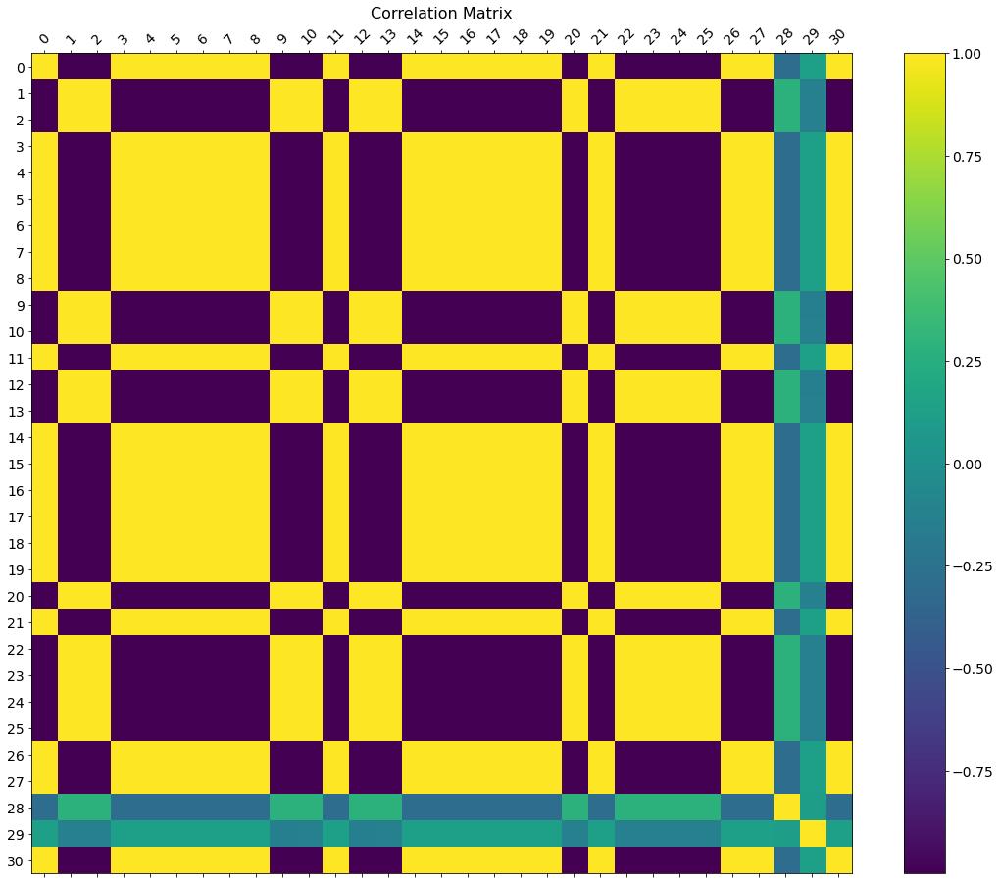

In [37]:
f = plt.figure(figsize=(19, 15))
plt.matshow(latent_df.corr(), fignum=f.number)
plt.xticks(range(latent_df.select_dtypes(['number']).shape[1]), latent_df.select_dtypes(['number']).columns, fontsize=14, rotation=45)
plt.yticks(range(latent_df.select_dtypes(['number']).shape[1]), latent_df.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

**Correlation Matrix**

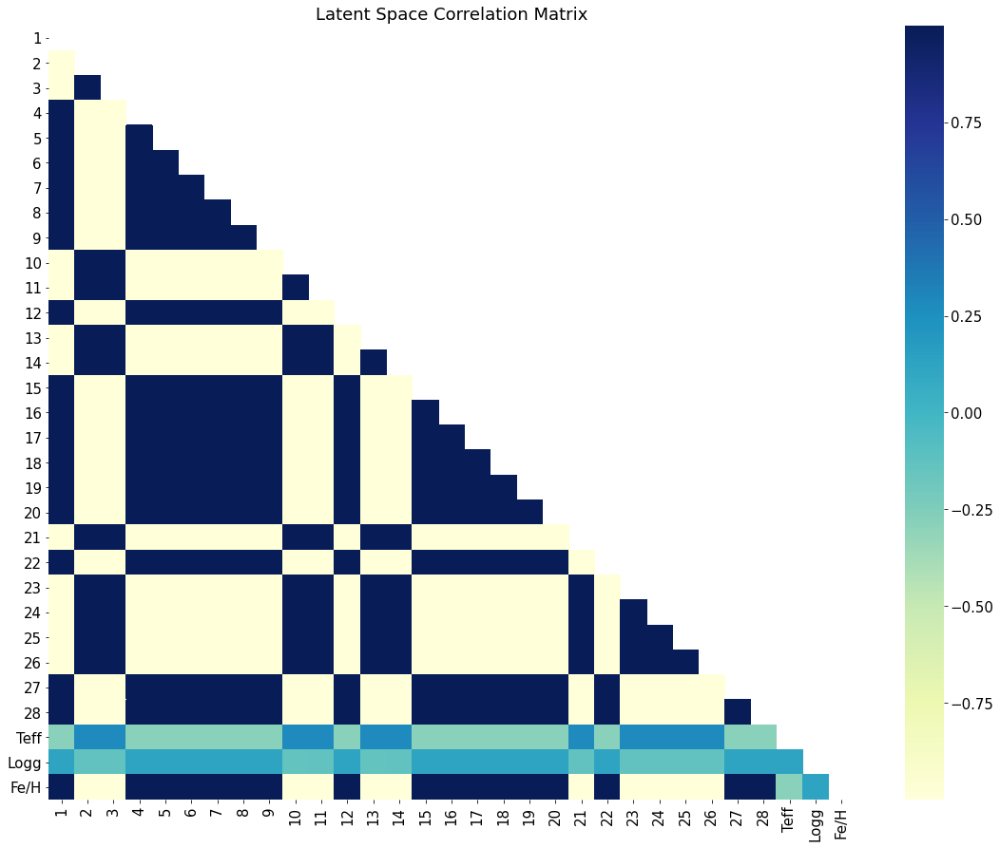

In [38]:
import seaborn as sb
f = plt.figure(figsize=(19, 15))

x_axis_labels = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,"Teff","Logg","Fe/H"] # labels for x-axis
y_axis_labels = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,"Teff","Logg","Fe/H"] # labels for y-axis

# creating mask
mask = np.triu(np.ones_like(latent_df.corr()))
# plotting a triangle correlation heatmap
dataplot = sb.heatmap(latent_df.corr(), cmap="YlGnBu", annot=False, mask=mask, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.title("Latent Space Correlation Matrix")
# displaying heatmap
plt.show()